<a href="https://www.kaggle.com/code/francescoliveras/ps-s3-e19-eda-model-en-es?scriptVersionId=136512562" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>


# <p style="font-family:Consolas Mono; font-weight:normal; letter-spacing: 2px; color:#37FABC; font-size:160%; text-align:center;padding: 0px; border-bottom: 5px solid #407A68">PlayGround Series S3 E19 EDA and simple model</p>

## <p style="font-family:Consolas Mono; font-weight:normal; letter-spacing: 2px; color:#06D1C7; font-size:130%; text-align:left;padding: 0px; border-bottom: 5px solid #008F77">Intro</p>

**🟦EN**:
<div class="alert alert-block alert-info" style="font-size:14px; font-family:verdana; line-height: 1.7em; color:#5361fc;">
This Kaggle workbook aims to provide a comprehensive exploratory data analysis (EDA) and a set of simple models (which will not be optimized), but which can give a vague idea of how to choose the best model for the given data set, with the ultimate goal of making decisions.
Through this EDA, we will be able to get a deeper understanding of the structure of the data, the values that have a relationship between them and the missing values and pattern or outliers that may affect when performing the modeling or selecting the model we want to use for prediction/recommendation. By performing an EDA, we can identify potential pitfalls and make the decisions and subsequent processing necessary to improve the performance and accuracy of the models.
</div>

**🟥ES**: 
<div class="alert alert-block alert-info" style="font-size:14px; font-family:verdana; line-height: 1.7em; background-color: #c9b1fa; color:#38196e;">
Este cuaderno Kaggle tiene el objetivo proporcionar un análisis exploratorio de datos (AED) exhaustivo y un conjunto de modelos simples (los cuales no estarán optimizados), pero que pueden llegar a dar una vaga idea para escoger el mejor modelo, para el conjunto de datos dado, con el objetivo final de tomar decisiones.

A través de este AED, podremos obtener una comprensión más profunda de la estructura de los datos, los valores que tiene una relación entre ellos y los valores que faltan y patrón o valores anómalos que pueda afectar a la hora de realizar el modelado o seleccionar el modelo que queremos utilizar para la predicción / recomendación. Al realizar un EDA, podemos identificar posibles obstáculos y tomar las decisiones, y posteriormente el procesado necesario para mejorar el rendimiento y la precisión de los modelos.
</div>

## <p style="font-family:Consolas Mono; font-weight:normal; letter-spacing: 2px; color:#06D1C7; font-size:130%; text-align:left;padding: 0px; border-bottom: 3px solid #008F77">Data information</p>

**🟦EN**:

For this challenge, you will be predicting a full year worth of sales for various fictitious learning modules from different fictitious Kaggle-branded stores in different (real!) countries. This dataset is completely synthetic, but contains many effects you see in real-world data, e.g., weekend and holiday effect, seasonality, etc. You are given the task of predicting sales during for year 2022.

*Files*

* ```train.csv``` - the training set, which includes the sales data for each date-country-store-item combination.
* ```test.csv``` - the test set; your task is to predict the corresponding item sales for each date-country-store-item combination. Note the Public leaderboard is scored on the first quarter of the test year, and the Private on the remaining.
* ```sample_submission.csv``` - a sample submission file in the correct format




**🟥ES**:

Para este reto, tendrás que predecir las ventas de todo un año de varios módulos de aprendizaje ficticios de diferentes tiendas ficticias de la marca Kaggle en diferentes países (¡reales!). Este conjunto de datos es completamente sintético, pero contiene muchos efectos que se ven en los datos del mundo real, por ejemplo, efecto fin de semana y vacaciones, estacionalidad, etc. La tarea consiste en predecir las ventas durante el año 2022.

*Archivos

* ```train.csv``` - el conjunto de entrenamiento, que incluye los datos de ventas para cada combinación de fecha-país-tienda-artículo.
* ```test.csv``` - el conjunto de prueba; su tarea es predecir las ventas de artículos correspondientes para cada combinación fecha-país-tienda-artículo. Tenga en cuenta que la tabla de clasificación Pública se puntúa en el primer trimestre del año de la prueba, y la Privada en el resto.
* ```sample_submission.csv``` - un archivo de envío de muestra en el formato correcto.

## <p style="font-family:Consolas Mono; font-weight:normal; letter-spacing: 2px; color:#06D1C7; font-size:130%; text-align:left;padding: 0px; border-bottom: 3px solid #008F77">Library import</p>

In [1]:
import os 
import sys
import math
import time
import random
import warnings
import numpy as np 
import pandas as pd
import seaborn as sns
import missingno as msno
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import matplotlib.colors as mcolors

from sklearn.metrics import make_scorer
from catboost import CatBoostRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import train_test_split


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
# Put theme of notebook 
from colorama import Fore, Style

# Colors
red = Fore.RED + Style.BRIGHT
mgta = Fore.MAGENTA + Style.BRIGHT
yllw = Fore.YELLOW + Style.BRIGHT
cyn = Fore.CYAN + Style.BRIGHT
blue = Fore.BLUE + Style.BRIGHT

# Reset
res = Style.RESET_ALL
plt.style.use({"figure.facecolor": "#282a36"})

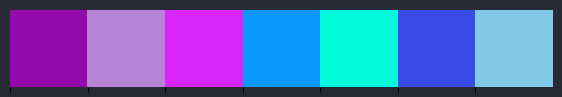

In [3]:
# Colors
YELLOW = "#F7C53E"

CYAN_G = "#0CF7AF"
CYAB_DARK = "#11AB7C"

PURPLE = "#D826F8"
PURPLE_DARJ = "#9309AB"
PURPLE_L = "#b683d6"

BLUE = "#0C97FA"
RED = "#FA1D19"
ORANGE = "#FA9F19"
GREEN = "#0CFA58"
LIGTH_BLUE = "#01FADC"
S_BLUE = "#81c9e6"
DARK_BLUE = "#394be6"
# Palettes
PALETTE_2 = [CYAN_G, PURPLE]
PALETTE_3 = [YELLOW, CYAN_G, PURPLE]
PALETTE_4 = [YELLOW, ORANGE, PURPLE, LIGTH_BLUE]
PALETTE_5 = [PURPLE_DARJ, PURPLE_L, PURPLE, BLUE, LIGTH_BLUE]
PALETTE_6 = [BLUE, RED, ORANGE, GREEN, LIGTH_BLUE, PURPLE]

# Vaporwave palette by Francesc Oliveras
PALETTE_7 = [PURPLE_DARJ, PURPLE_L, PURPLE, BLUE, LIGTH_BLUE, DARK_BLUE, S_BLUE]
PALETTE_7_C = [PURPLE_DARJ, BLUE, PURPLE, LIGTH_BLUE, PURPLE_L, S_BLUE, DARK_BLUE]
INCLUDE_ORIGINAL = True
SEED = 500

sns.palplot(sns.color_palette(PALETTE_7))

# Set Style
sns.set_style("whitegrid")
sns.despine(left=True, bottom=True)

cmap = mcolors.LinearSegmentedColormap.from_list("", PALETTE_2)
cmap_2 = mcolors.LinearSegmentedColormap.from_list("", [S_BLUE, PURPLE_DARJ])

font_family = dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=10), width=1000, height=500))

## <p style="font-family:Consolas Mono; font-weight:normal; letter-spacing: 2px; color:#06D1C7; font-size:130%; text-align:left;padding: 0px; border-bottom: 3px solid #008F77">Constants</p>

In [4]:
PATH = "/kaggle/input/playground-series-s3e19"
TEST_FILENAME = "test.csv"
TRAIN_FILENAME = "train.csv"
SUBMISSION_FILENAME = "sample_submission.csv"

# Data dir
TRAIN_DIR = os.path.join(PATH, TRAIN_FILENAME)
TEST_DIR = os.path.join(PATH, TEST_FILENAME)
SUBMISSION_DIR = os.path.join(PATH, SUBMISSION_FILENAME)

ID = "id"
DATE = "date"
COUNTRY = "country"
STORE = "store"
PRODUCT = "product"
TARGET = "num_sold"

## <p style="font-family:Consolas Mono; font-weight:normal; letter-spacing: 2px; color:#06D1C7; font-size:130%; text-align:left;padding: 0px; border-bottom: 3px solid #008F77">Functions</p>

In [5]:
def show_corr_heatmap(df, title):
    
    corr = df.corr()
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True

    plt.figure(figsize = (15, 10))
    plt.title(title)
    sns.heatmap(corr, annot = True, linewidths=.5, fmt=".2f", square=True, mask = mask, cmap=cmap_2)
    plt.show()

In [6]:
def data_description(df):
    print("Data description")
    print(f"Total number of records {df.shape[0]}")
    print(f'number of features {df.shape[1]}\n\n')
    columns = df.columns
    data_type = []
    
    # Get the datatype of features
    for col in df.columns:
        data_type.append(df[col].dtype)
        
    n_uni = df.nunique()
    # Number of NaN values
    n_miss = df.isna().sum()
    
    names = list(zip(columns, data_type, n_uni, n_miss))
    variable_desc = pd.DataFrame(names, columns=["Name","Type","Unique levels","Missing"])
    print(variable_desc)

In [7]:
def plot_cont(col, ax, color=PALETTE_7[0]):
    sns.histplot(data=comb_df, x=col,
                hue="set",ax=ax, hue_order=labels,
                common_norm=False, **histplot_hyperparams)
    
    ax_2 = ax.twinx()
    ax_2 = plot_cont_dot(
        comb_df.query('set=="train"'),
        col, TARGET, ax_2,
        color=color
    )
    
    ax_2 = plot_cont_dot(
        comb_df, col,
        TARGET, ax_2,
        color=color
    )

In [8]:
## Boolean values only
def pie_plot(df: pd.DataFrame, hover_temp: str = "Status: ",
            feature=TARGET, palette=[LIGTH_BLUE,"#221e8f"], color=[BLUE ,DARK_BLUE],
            title="Target distribution"):
#     df[feature] = df[feature].replace({0: "Not cancelled ", 1: "Cancelled"})
    target = df[[feature]].value_counts(normalize=True).sort_index().round(decimals=3)*100
    fig = go.Figure()
    
    fig.add_trace(go.Pie(labels=target.index, values=target, hole=.4,
                        sort=False, showlegend=True, marker=dict(colors=color, line=dict(color=palette,width=2)),
                        hovertemplate = "%{label} " + hover_temp + ": %{value:.2f}%<extra></extra>"))
    
    fig.update_layout(template=font_family, title=title, 
                  legend=dict(traceorder='reversed',y=1.05,x=0),
                  uniformtext_minsize=15, uniformtext_mode='hide',height=600)
    fig.show()

In [9]:
def feature_dist(df: pd.DataFrame, feature: str, title : str):    
    fig, ax = plt.subplots(1, 2, figsize = (15, 5))
    ax = ax.flatten()

    ax[0].pie(
        df[feature].value_counts(),  
        autopct = "%2.f%%",
        colors = PALETTE_7_C,
        explode = [.1 for i in range(0, 5)], 
        textprops = {"size" : 15, "color" : "white"}
    )

    sns.countplot(data = df, y = feature, ax = ax[1], palette = PALETTE_7_C, order = df[feature].value_counts().index)
    ax[1].yaxis.label.set_size(20)
    plt.yticks(fontsize = 12)
    ax[1].set_xlabel("Count", fontsize = 20)
    ax[1].set_ylabel(None)
    plt.xticks(fontsize = 12)

    fig.suptitle(f"{title}", fontsize = 25)
    plt.tight_layout()

In [10]:
def feature_dist_adap(df: pd.DataFrame, feature: str, title : str):
    fig, ax = plt.subplots(1, 2, figsize = (15, 5))
    ax = ax.flatten()

    ax[0].pie( 
        test_df[feature].value_counts(), 
        explode = [.1 for i in range(0, 3)], 
        autopct = '%2.f%%',
        textprops = {'size' : 15, 'color' : 'white'},
        colors = PALETTE_7_C
    )

    sns.countplot(data = df, y = feature, ax = ax[1], palette = PALETTE_7_C, order = df[feature].value_counts().index)
    ax[1].yaxis.label.set_size(20)
    plt.yticks(fontsize = 10)
    ax[1].set_xlabel('Count', fontsize = 20)
    ax[1].set_ylabel(None)
    plt.xticks(fontsize = 10)

    fig.suptitle(f"{title}", fontsize = 25)
    plt.tight_layout()

In [11]:
def extract_date(df, column_name):
    # Convert the column to datetime type
    df[column_name] = pd.to_datetime(df[column_name])
    
    # Extract year, month, day, and weekday
    df["year"] = df[column_name].dt.year
    df["month"] = df[column_name].dt.month
    df["day"] = df[column_name].dt.day
    df["weekday"] = df[column_name].dt.weekday
    
    # Return the modified DataFrame
    return df

In [12]:
def smape(y_true, y_pred):
    numerator = 2 * np.abs(y_pred - y_true)
    denominator = np.abs(y_pred) + np.abs(y_true)
    smape_array = np.divide(numerator, denominator, where=denominator!=0)
    smape_percentage = np.mean(smape_array) * 100
    return smape_percentage

## <p style="font-family:Consolas Mono; font-weight:normal; letter-spacing: 2px; color:#06D1C7; font-size:130%; text-align:left;padding: 0px; border-bottom: 3px solid #008F77">Import data</p>

In [13]:
train_df = pd.read_csv(TRAIN_DIR)
test_df = pd.read_csv(TEST_DIR)
submission_df = pd.read_csv(SUBMISSION_DIR)

## <p style="font-family:Consolas Mono; font-weight:normal; letter-spacing: 2px; color:#06D1C7; font-size:130%; text-align:left;padding: 0px; border-bottom: 3px solid #008F77">EDA and data modification</p>

In [14]:
print(f"Train dataframe description\n")
data_description(train_df)
print(f"Test dataframe description\n")
data_description(test_df)

Train dataframe description

Data description
Total number of records 136950
number of features 6


       Name    Type  Unique levels  Missing
0        id   int64         136950        0
1      date  object           1826        0
2   country  object              5        0
3     store  object              3        0
4   product  object              5        0
5  num_sold   int64           1028        0
Test dataframe description

Data description
Total number of records 27375
number of features 5


      Name    Type  Unique levels  Missing
0       id   int64          27375        0
1     date  object            365        0
2  country  object              5        0
3    store  object              3        0
4  product  object              5        0


In [15]:
train_df.head()

,id,date,country,store,product,num_sold
0,0,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding,63
1,1,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs,66
2,2,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People,9
3,3,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions,59
4,4,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better,49


In [16]:
test_df.head()

,id,date,country,store,product
0,136950,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding
1,136951,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs
2,136952,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People
3,136953,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions
4,136954,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better


In [17]:
train_df.drop(ID, axis=1, inplace=True)
test_df.drop(ID, axis=1, inplace=True)

In [18]:
labels = ["train", "test"]

comb_df = pd.concat([
    train_df.assign(set=labels[0]),
    test_df.assign(set=labels[1]),
])
comb_df.reset_index(inplace=True)

In [19]:
# Crear la figura y los subplots
fig, axes = plt.subplots(nrows=3, figsize=(20, 30), dpi=350)

# G1
sns.lineplot(data=train_df, x=DATE, y=TARGET, errorbar=None, color=PALETTE_7[0], ax=axes[0])
axes[0].set_title('Sales Over Time', fontsize=25)

# G2
sns.lineplot(data=train_df, x=DATE, y=TARGET, hue=STORE, errorbar=None, palette=PALETTE_7_C, ax=axes[1])
axes[1].set_title('Sales Over Time x store', fontsize=25)

# G3
sns.lineplot(data=train_df, x=DATE, y=TARGET, hue = COUNTRY, errorbar=None, palette=PALETTE_7_C, ax=axes[2])
axes[2].set_title('Sales Over Time x country', fontsize=25)

# Mostrar los gráficos
plt.tight_layout()
plt.show()

/tmp/ipykernel_20/2213655769.py:9: UserWarning: The palette list has more values (7) than needed (3), which may not be intended.
  sns.lineplot(data=train_df, x=DATE, y=TARGET, hue=STORE, errorbar=None, palette=PALETTE_7_C, ax=axes[1])
/tmp/ipykernel_20/2213655769.py:13: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  sns.lineplot(data=train_df, x=DATE, y=TARGET, hue = COUNTRY, errorbar=None, palette=PALETTE_7_C, ax=axes[2])


None

None

None

None

None

None

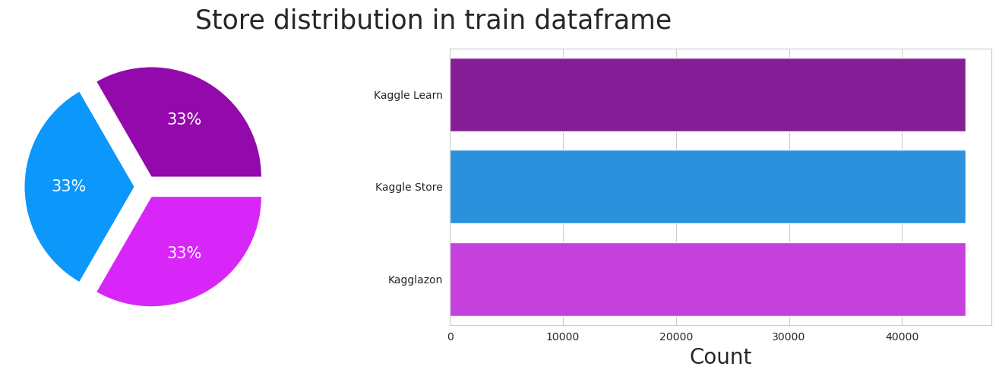

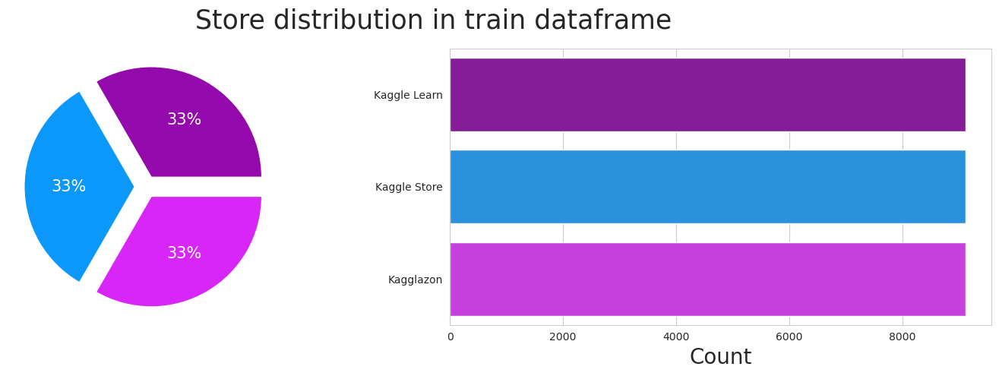

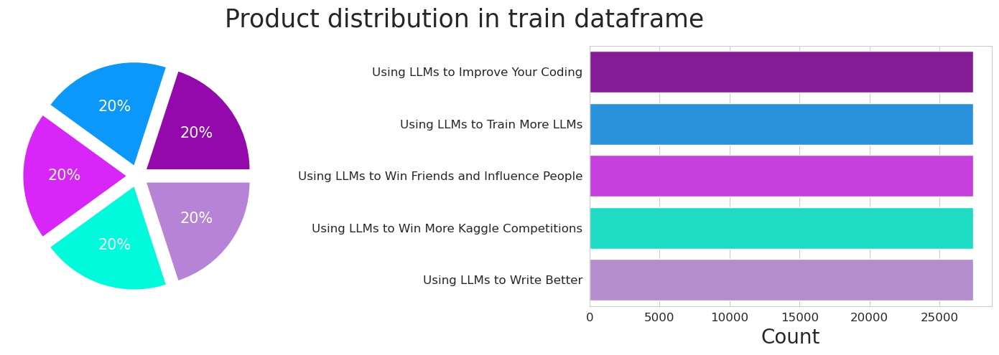

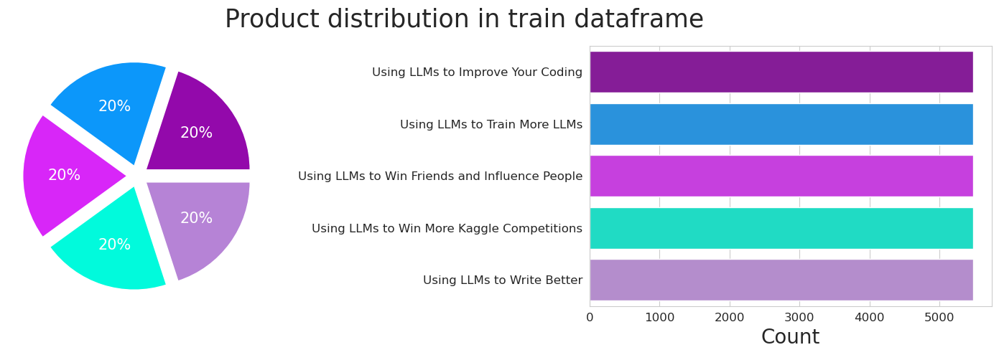

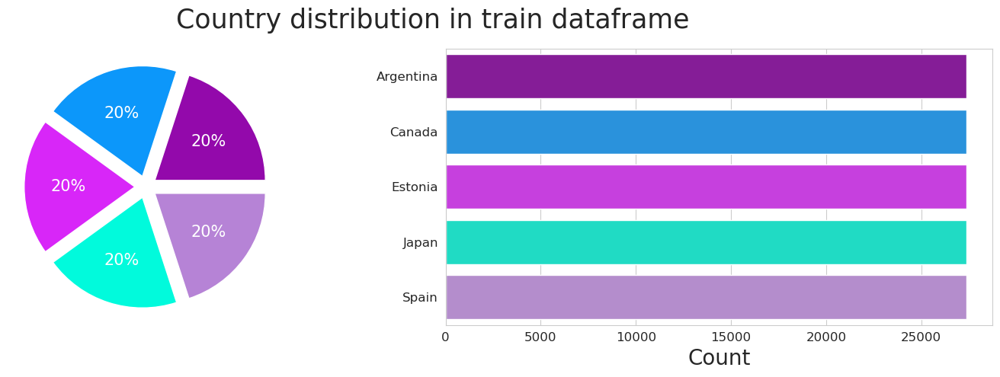

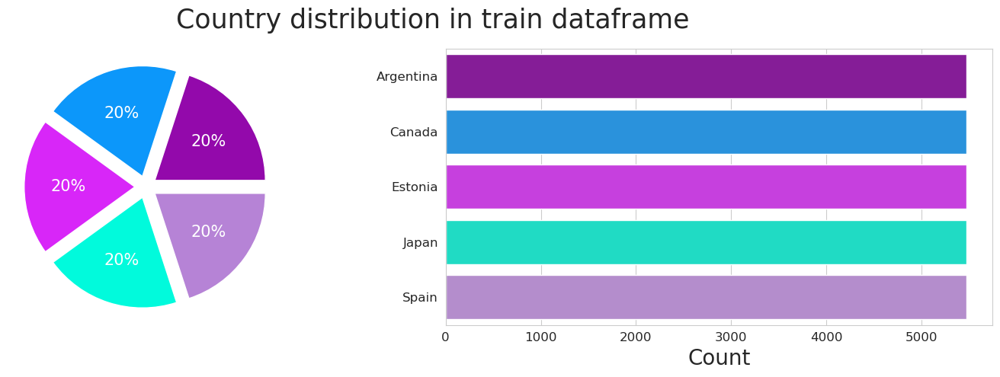

In [20]:
display(feature_dist_adap(train_df, STORE, "Store distribution in train dataframe"))
display(feature_dist_adap(test_df, STORE, "Store distribution in train dataframe"))
display(feature_dist(train_df, PRODUCT, "Product distribution in train dataframe"))
display(feature_dist(test_df, PRODUCT, "Product distribution in train dataframe"))
display(feature_dist(train_df, COUNTRY, "Country distribution in train dataframe"))
display(feature_dist(test_df, COUNTRY, "Country distribution in train dataframe"))

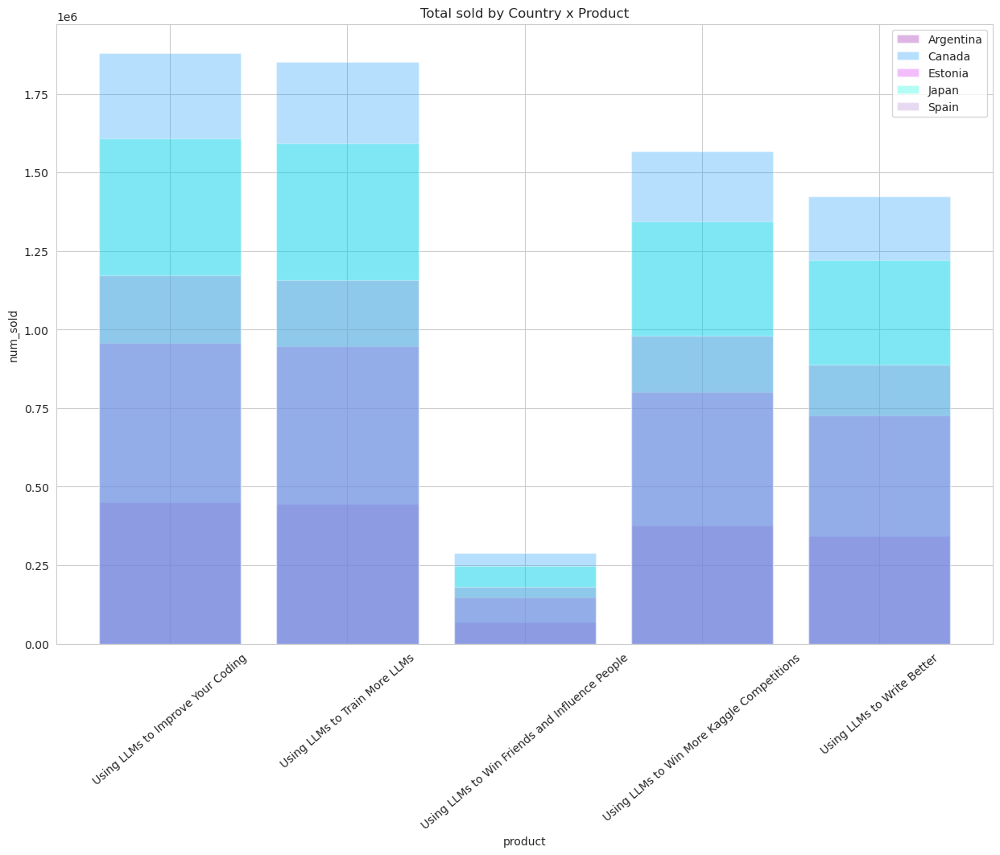

In [21]:
temp_df = train_df
temp_df[DATE] = pd.to_datetime(temp_df[DATE])

gb_df = temp_df.groupby([COUNTRY, PRODUCT]).num_sold.sum().reset_index()
plt.figure(figsize=(15, 10))

for color_pos, country in enumerate(gb_df[COUNTRY].unique()):
    color = PALETTE_7_C[color_pos]
    plt.bar(gb_df[gb_df[COUNTRY] == country][PRODUCT], 
            gb_df[gb_df[COUNTRY] == country][TARGET], 
            alpha=0.3, 
            label=country,
            color=color)

plt.title(f"Total sold by Country x Product")
plt.xlabel(PRODUCT)
plt.ylabel(TARGET)
plt.xticks(rotation=40)
plt.legend()

plt.show()

In [22]:
unique_countries = gb_df[COUNTRY].unique()
unique_countries

array(['Argentina', 'Canada', 'Estonia', 'Japan', 'Spain'], dtype=object)

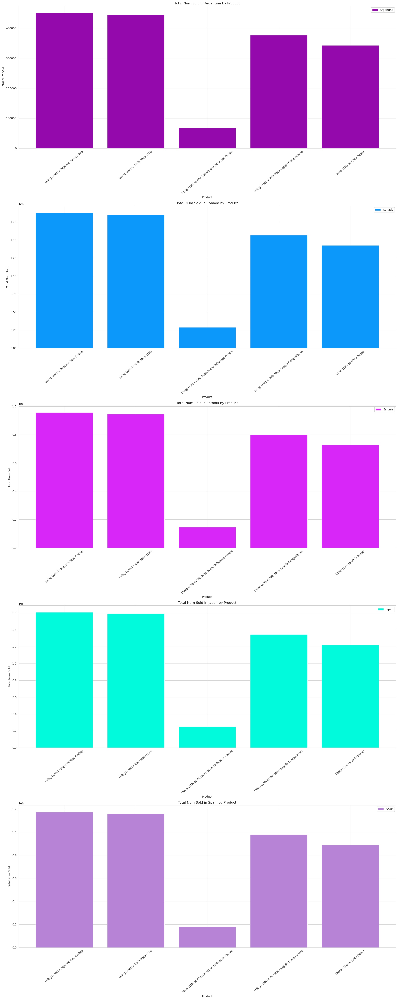

In [23]:
fig, axs = plt.subplots(len(unique_countries), 1, figsize=(20, 10*len(unique_countries)))

for i, country in enumerate(unique_countries):
    country_df = gb_df[gb_df[COUNTRY] == country]
    axs[i].bar(country_df[PRODUCT], country_df[TARGET]
               , label=country, color=PALETTE_7_C[i])
    
    axs[i].set_title(f"Total Num Sold in {country} by Product")
    axs[i].set_xlabel("Product")
    axs[i].set_ylabel("Total Num Sold")
    axs[i].legend()
    axs[i].tick_params(axis="x", rotation=40)
    
plt.tight_layout()
plt.show()

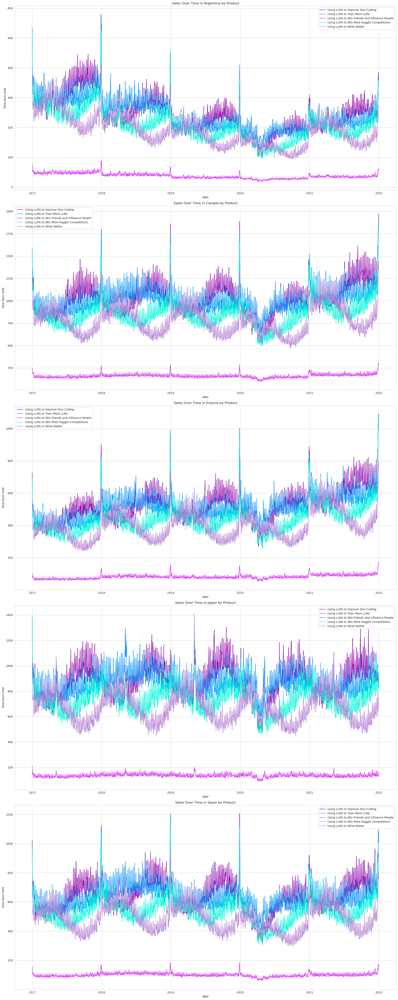

In [24]:
temp_df[DATE] = pd.to_datetime(temp_df[DATE])

timedata_df = temp_df.groupby([DATE, PRODUCT, COUNTRY], as_index=False)[TARGET].sum()

unique_countries = timedata_df[COUNTRY].unique()

fig, axs = plt.subplots(len(unique_countries), 1, figsize=(20, 10*len(unique_countries)))

for i, country in enumerate(unique_countries):
    country_df = timedata_df[timedata_df[COUNTRY] == country]
    for color_pos, product in enumerate(country_df[PRODUCT].unique()):
        product_df = country_df[country_df[PRODUCT] == product]
        axs[i].plot(product_df[DATE], product_df[TARGET], label=product, color=PALETTE_7_C[color_pos])
        
    axs[i].set_title(f"Sales Over Time in {country} by Product")
    axs[i].set_xlabel(DATE)
    axs[i].set_ylabel("Total Num Sold")
    axs[i].legend()

plt.tight_layout()
plt.show()

In [25]:
train_df = extract_date(train_df, DATE)
test_df = extract_date(test_df, DATE)

In [26]:
train_df.set_index("date",inplace=True)
test_df.set_index("date",inplace=True)

In [27]:
train_df

,country,store,product,num_sold,year,month,day,weekday
date,,,,,,,,
2017-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding,63,2017,1,1,6
2017-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs,66,2017,1,1,6
2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People,9,2017,1,1,6
2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions,59,2017,1,1,6
2017-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better,49,2017,1,1,6
...,...,...,...,...,...,...,...,...
2021-12-31,Spain,Kagglazon,Using LLMs to Improve Your Coding,700,2021,12,31,4
2021-12-31,Spain,Kagglazon,Using LLMs to Train More LLMs,752,2021,12,31,4
2021-12-31,Spain,Kagglazon,Using LLMs to Win Friends and Influence People,111,2021,12,31,4


In [28]:
train_df.shape

(136950, 8)

In [29]:
encoder = LabelEncoder()
enc_columns = [COUNTRY, STORE, PRODUCT]

for column in enc_columns:
    train_df[column] = encoder.fit_transform(train_df[column])
    test_df[column] = encoder.transform(test_df[column])

In [30]:
X = train_df.drop(TARGET, axis=1)
y = train_df[TARGET]

print(f"X shape: {X.shape}\ny shape: {y.shape}")

X shape: (136950, 7)
y shape: (136950,)


In [31]:
scores = []
tss = TimeSeriesSplit(n_splits=8)
test_preds = np.zeros(len(test_df))

In [32]:
smape_scorer = make_scorer(smape, greater_is_better=False)

In [33]:
for fold,(train_index, test_index) in enumerate(tss.split(X,y)):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    catboost_model = CatBoostRegressor(random_state=SEED)
    catboost_model.fit(X_train, y_train, verbose=False)

    y_pred = catboost_model.predict(X_test)

    score = smape(y_test, y_pred)
    scores.append(score)
    print(f"{yllw}Fold {fold+1}{res}: Symmetric Mean Absolute Percentage Error Score ==> {cyn}{score}{res}")
    test_preds += catboost_model.predict(test_df)

mean_score = np.mean(scores)
print(f"\n\n{mgta}Mean SMAPE score{res}: {red}{mean_score}{res}")

Fold 1: Symmetric Mean Absolute Percentage Error Score ==> 13.177987753990598
Fold 2: Symmetric Mean Absolute Percentage Error Score ==> 7.941510186183553
Fold 3: Symmetric Mean Absolute Percentage Error Score ==> 9.443844461719737
Fold 4: Symmetric Mean Absolute Percentage Error Score ==> 9.241465349061023
Fold 5: Symmetric Mean Absolute Percentage Error Score ==> 14.806841852430447
Fold 6: Symmetric Mean Absolute Percentage Error Score ==> 18.624214212623777
Fold 7: Symmetric Mean Absolute Percentage Error Score ==> 24.539886428022584
Fold 8: Symmetric Mean Absolute Percentage Error Score ==> 12.660216209899373


Mean SMAPE score: 13.804495806741386


In [34]:
submission_df[TARGET] = test_preds/3
submission_df.to_csv("submission.csv",index=False)

In [35]:
submission_df

,id,num_sold
0,136950,95.836863
1,136951,94.147032
2,136952,0.324803
3,136953,100.865935
4,136954,65.969619
...,...,...
27370,164320,1749.554154
27371,164321,1696.289501
27372,164322,302.435939
27373,164323,1552.228978


### This notebook is under development, I would appreciate a comment with your opinion and things to improve.